## HR Analytics Project- Understanding the Attrition in HR
- Problem Statemen

Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

## HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

## Attrition in HR
Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.
How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

## Attrition affecting Companies
A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

In [1]:
import pandas as pd 
import numpy as np
from sklearn import metrics 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline 

import warnings
warnings.filterwarnings('ignore')

In [2]:
hr_df = pd.read_csv("HR-Employee-Attrition.csv")
hr_df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [3]:
hr_df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
hr_df.tail()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8
1469,34,No,Travel_Rarely,628,Research & Development,8,3,Medical,1,2068,...,1,80,0,6,3,4,4,3,1,2


The result for the first 5 rows and the last five rows of this dataset shows that the content of the data contains Independent and dependent features, also these features or varaibles are categorical and numerical.Again, the Attrition is two classes which is the label/target and this situation is a classification problem.

In [5]:
hr_df.head(5)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


# Exploratory Data Analysis (EDA)

In [6]:
# shape of the dataset
print('shape of dataset', hr_df.shape)

shape of dataset (1470, 35)


The data set contains 1470 rows and 35 columns 

In [7]:
# Types of datasets
print(hr_df.dtypes)

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

dataset contain obejct and int64 data types 

In [182]:
# checking info about the dataset
hr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

This give infomation about the dataset. indexRange, column type, non nulls values and memory usage 402.1+ KB

In [183]:
# Checking unique values 
hr_df.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

The result shows columns with the unique values. EmployeeCount, Over 18 and StandardHours are 1.I will be dropping them because they have no importance in model building 

In [184]:
# # Checking each columns counts 
for i in  hr_df:
    print(hr_df[i].value_counts())
    print('\n')

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64


No     1233
Yes     237
Name: Attrition, dtype: int64


Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23     2

There is no blank space or repeated data in our datasets. However, our target variable counts which contains two unique classes shows that 'No' class is higher than yes class which make the data imbalnce, so we need to apply the SMOT technique to balance the data and to avoid biasness in machine learning.

In [18]:
# Checkinh nulls values 
hr_df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

<Axes: >

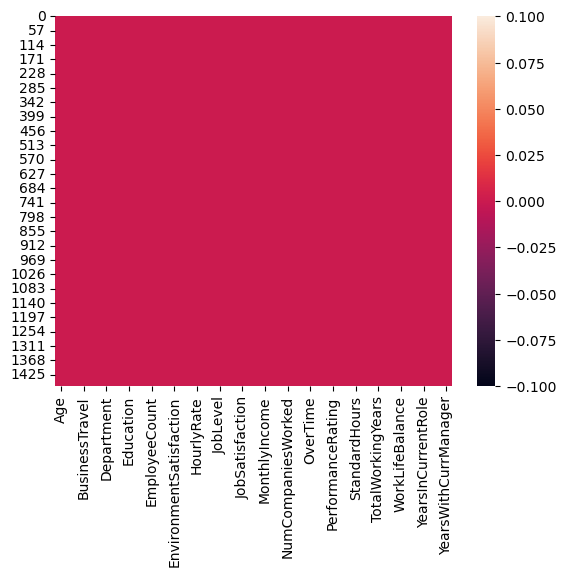

In [186]:
# checking nulls values with heapmapn
sns.heatmap(hr_df.isnull())

The above plot confirming there are no null values 

## Data Statistical Summary 

In [187]:
hr_df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


Brief statistical information of the data set shows the dataset look okay simply because their are no negavtive values present. 
Futhermore, the counts of the dataset in all columns are same (1470.000000), that is no missing or nulls values present.The data is skewed to the right, meaning the mean values in some columns is more than the 50%, and also skewed to the left because in some columns like Education and EnvironmentSatisfaction and HourlyRate the median (50%) is more than the mean. The Min age of workers/employee is above 18 and more than 50% of them is above 36 and the max age is 60 respectively.Howerever i am aobserving  outliers in the dataset because columns like YearsSinceLastPromotion, DailyRate, YearsWithCurrManager the max values is far from the 75%. Also the std in some columns like YearsSinceLastPromotion, YearsSinceLastPromotion is higher than the mean. 


In [8]:
# Checking for categorical and numerical columns 
# checking for numerical columns
cat_col=[]
num_col=[]
for i in hr_df.dtypes.index:
    if hr_df.dtypes[i]=='object':
        cat_col.append(i)
    elif hr_df.dtypes[i]!='object':
        num_col.append(i)
print('categorical columns', cat_col)
print('number of categorical', len(cat_col))
print('\nnumerical columns', num_col)
print('number of numerical', len(num_col))



categorical columns ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']
number of categorical 9

numerical columns ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
number of numerical 26


# Visualizing Each Of The Categorical Columns 

In [20]:
from pandas.plotting import scatter_matrix

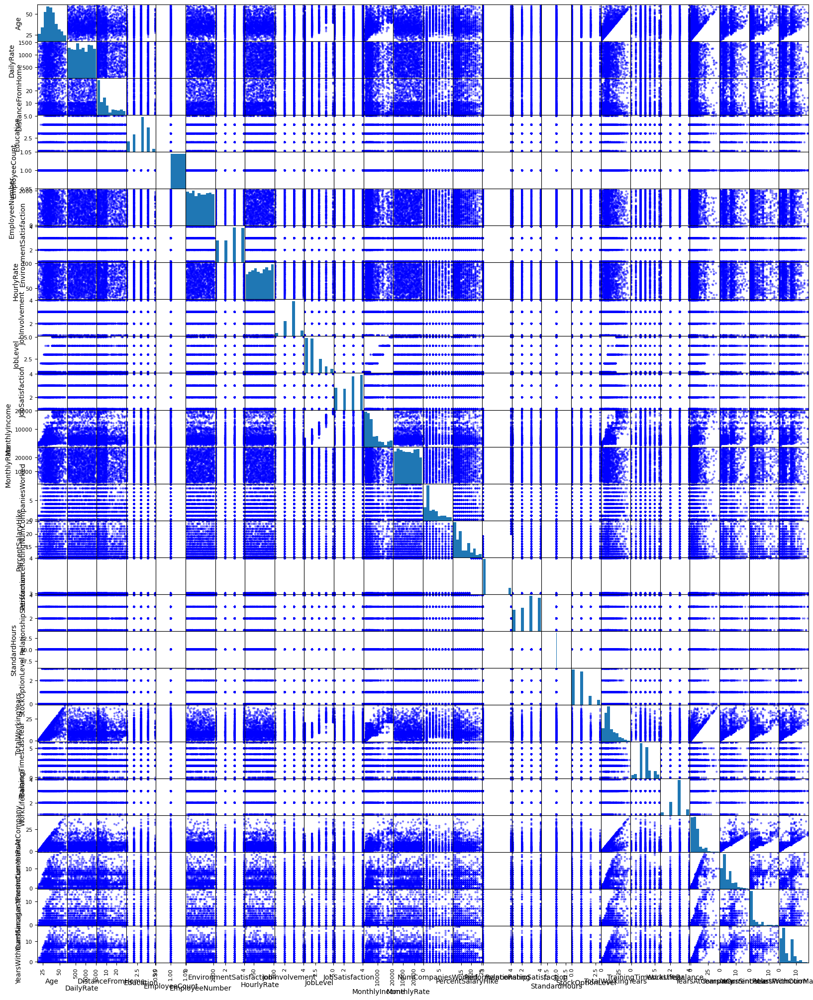

In [16]:
scatter_matrix(hr_df, figsize=(20,25), color='b')
plt.show()

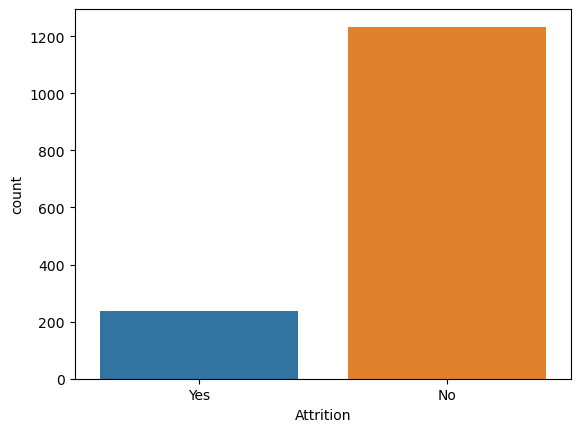

<Figure size 500x1000 with 0 Axes>

No     1233
Yes     237
Name: Attrition, dtype: int64


In [190]:
sns.countplot(x = 'Attrition', data = hr_df)
plt.figure(figsize=(5,10))
plt.show()
print(hr_df['Attrition'].value_counts())

Another confirmation in the Attrition which is the target column  the 'No' value is higher than the 'Yes' which makes the data is inbalance and we need to be balnce using SMOT technique before model machine learning 

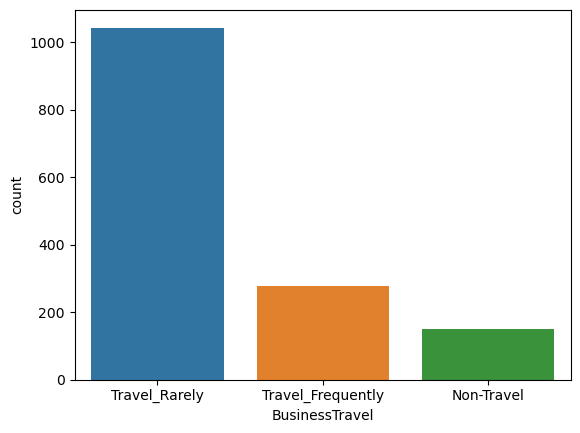

<Figure size 500x1000 with 0 Axes>

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
1470


In [191]:
sns.countplot(x = 'BusinessTravel', data = hr_df)
plt.figure(figsize=(5,10))
plt.show()
print(hr_df['BusinessTravel'].value_counts())
print(hr_df['BusinessTravel'].value_counts().sum())

- This plot shows at of 1470 employees 
- 1043 of the travel rarely travel 
- 277 of them travel frequently on business trips 
- 150 of the don't travel



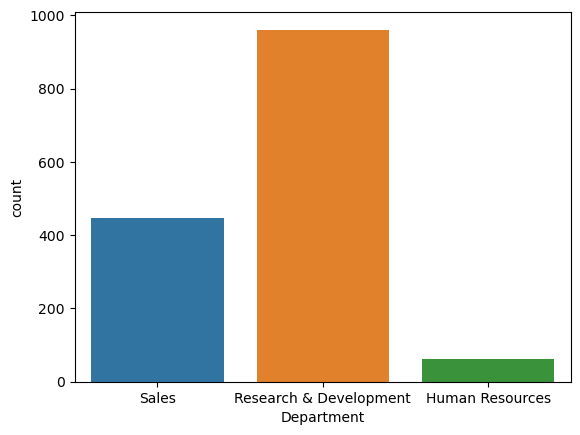

<Figure size 500x1000 with 0 Axes>

Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
1470


In [192]:
sns.countplot(x = 'Department', data = hr_df)
plt.figure(figsize=(5,10))
plt.show()
print(hr_df['Department'].value_counts())
print(hr_df['Department'].value_counts().sum())

The plot shows the company has 1470 department 
- Research and Development has 961 number of employees which is the highest 
- Sale Department which is the second highest has 446 number of employees
- Resources department which is the lowest has 63 employees 


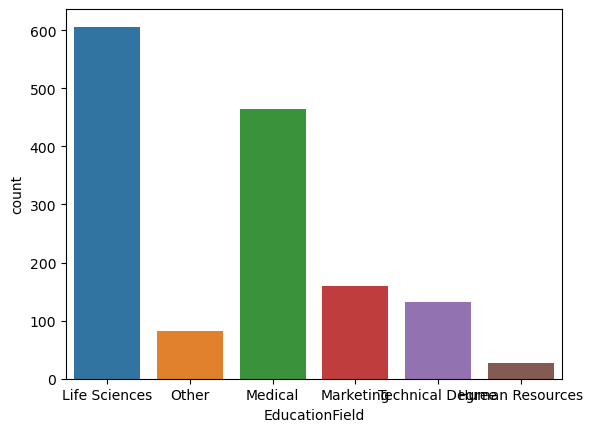

<Figure size 1500x2000 with 0 Axes>

Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64
1470


In [193]:
sns.countplot(x = 'EducationField', data = hr_df)
plt.figure(figsize=(15,20))
plt.show()
print(hr_df['EducationField'].value_counts())
print(hr_df['EducationField'].value_counts().sum())

plots showing 1470 numbers of employees from different education fields 
- Life Sciences has the highest number of employees which is 606
- Medical has 464 numbers of employees 
- Marketing has 159 numbers of employees 
- Technical Degree has 132 numbers of employees
- Other has 82 numbers of employees 
- Human Resources has 27 number of employees which is the least of all educational field

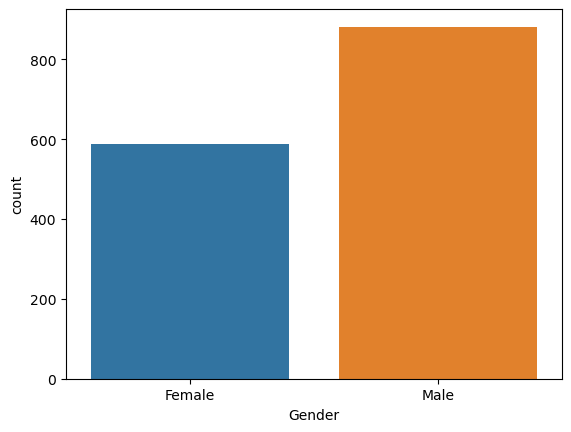

<Figure size 640x480 with 0 Axes>

Male      882
Female    588
Name: Gender, dtype: int64
1470


In [194]:
sns.countplot(x = 'Gender', data = hr_df)
plt.figure()
plt.show()
print(hr_df['Gender'].value_counts())
print(hr_df['Gender'].value_counts().sum())

The plot shows the number gender,  Male employees are 882 which is hihher than female employees of 588 

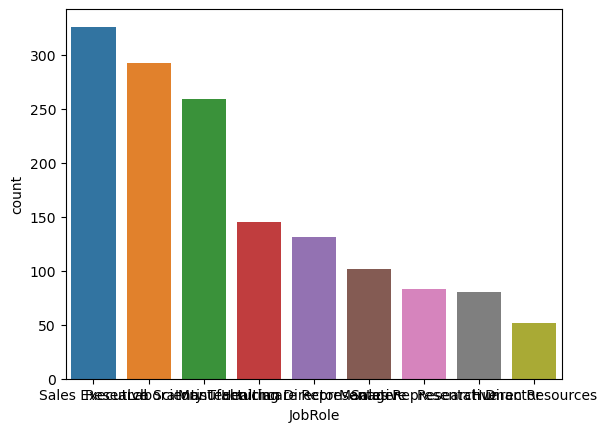

<Figure size 640x480 with 0 Axes>

Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64
1470


In [195]:
sns.countplot(x = 'JobRole', data = hr_df)
plt.figure()
plt.show()
print(hr_df['JobRole'].value_counts())
print(hr_df['JobRole'].value_counts().sum())

The above plote shows the jobrole of the employess
- sales Executive has the higest number  of employees in the  jobrole which 326
- Research Scientist the second highest number of employees in the Job role with figure of 292
- Laboratory Technician has 259 number employees in the Jobrole 
- Manufacturing Director has 145 of employees in that Job role 
- Healthcare Representative has 131 number of employees in that Job role 
- Managers 102 number of employees in that Job role 
- Sales Representative 83 number of empoyees in the Job Role 
- Research director 80 numbers of employees in that Job role
- Human Resources 52 numbers of employees in that Job Role 


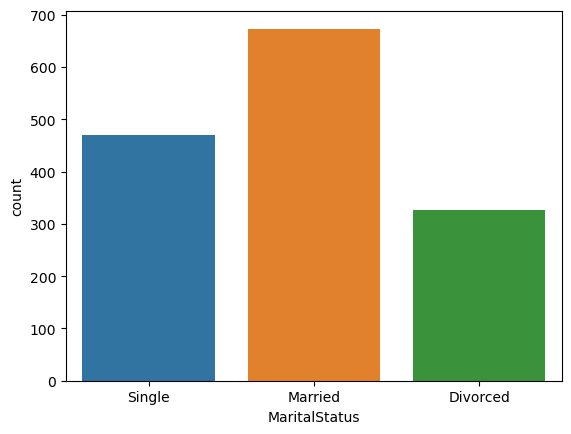

<Figure size 640x480 with 0 Axes>

Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64
1470


In [196]:
sns.countplot(x = 'MaritalStatus', data = hr_df)
plt.figure()
plt.show()
print(hr_df['MaritalStatus'].value_counts())
print(hr_df['MaritalStatus'].value_counts().sum())

The above plot shows the Marital status of the employees 
- Employees who are married 673 which are the highest 
- Secondly fellowed by employees who are singles with the total number of 470
- Lastly 327  divorced employees  

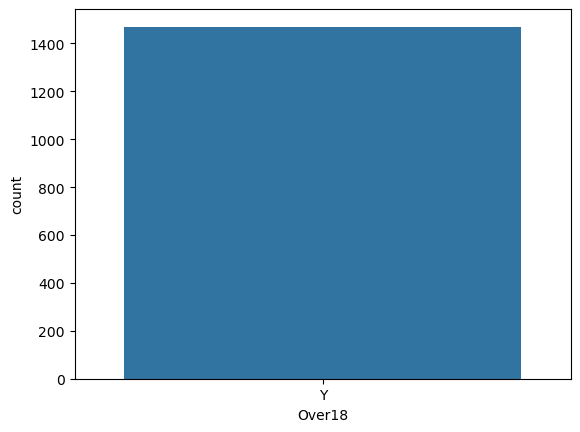

<Figure size 640x480 with 0 Axes>

Y    1470
Name: Over18, dtype: int64
1470


In [197]:
sns.countplot(x = 'Over18', data = hr_df)
plt.figure()
plt.show()
print(hr_df['Over18'].value_counts())
print(hr_df['Over18'].value_counts().sum())

The plot shows that all employees are over 18 yrs of age

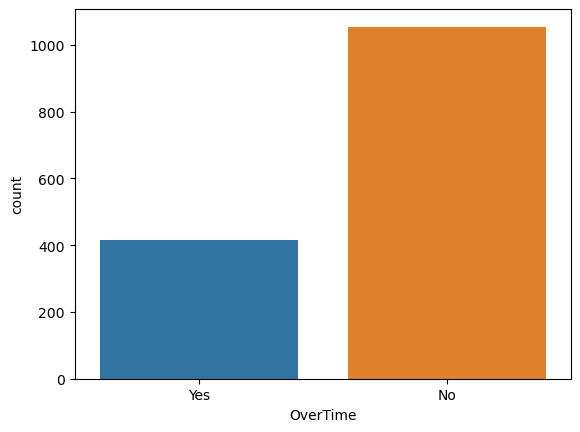

<Figure size 640x480 with 0 Axes>

No     1054
Yes     416
Name: OverTime, dtype: int64
1470


In [198]:
sns.countplot(x = 'OverTime', data = hr_df)
plt.figure()
plt.show()
print(hr_df['OverTime'].value_counts())
print(hr_df['OverTime'].value_counts().sum())

The above plot result clearly show employees who don't work overtine is more than those employees who work over time 

## Bivariate Analysis
### correlationship between features and Target 

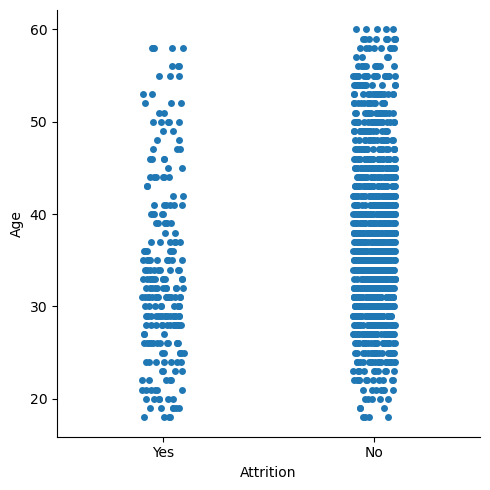

In [199]:
# Relationship between 'Age' and 'Attribute'
sns.catplot(x='Attrition', y='Age', data= hr_df)
plt.show()

The above catplot shows that the Attrition of employees who are above 6oyrs group is low

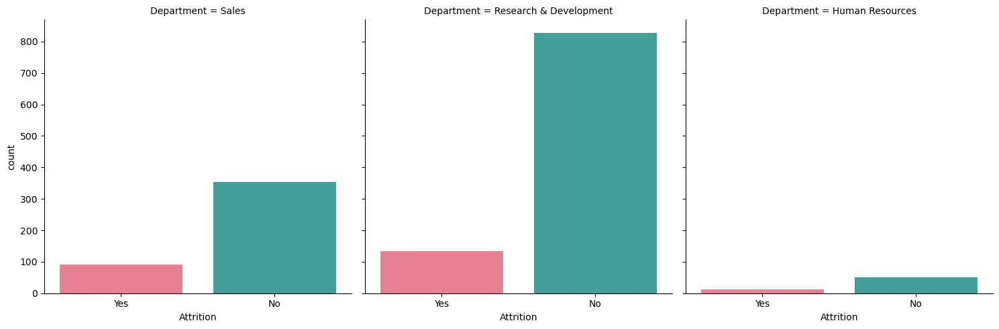

In [200]:
#checking the relation between 'Attrition' and 'Department'
sns.catplot(x='Attrition',col='Department',data=hr_df,kind='count', palette="husl")

Research & and Devlopment has the highest Attrition than the other department 

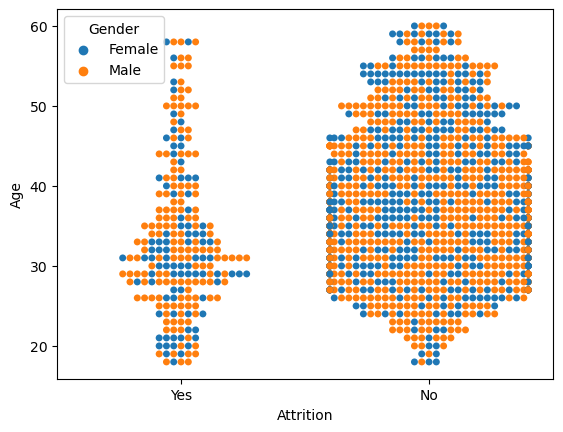

In [201]:
sns.swarmplot(x ='Attrition', y='Age', data = hr_df, hue = 'Gender')
plt.show()

The above swarm plot shows that the Attrition counts both in male and female are high when they are in their mid 20's and 30's of age.

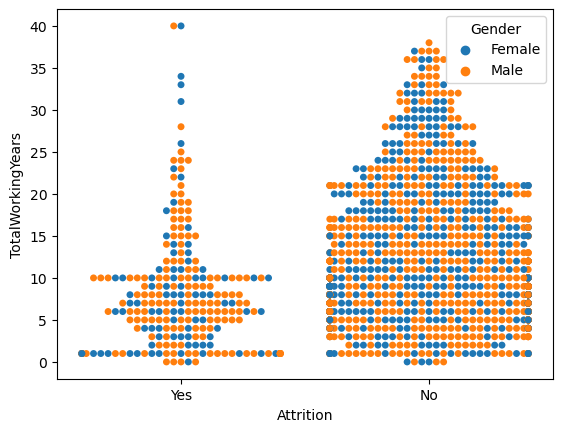

In [202]:
sns.swarmplot(x="Attrition", y="TotalWorkingYears", hue="Gender", data=hr_df)
plt.show()

The plot shows that the Attrition for both male and female employees occur when they are in their experience range of 1-10 years.

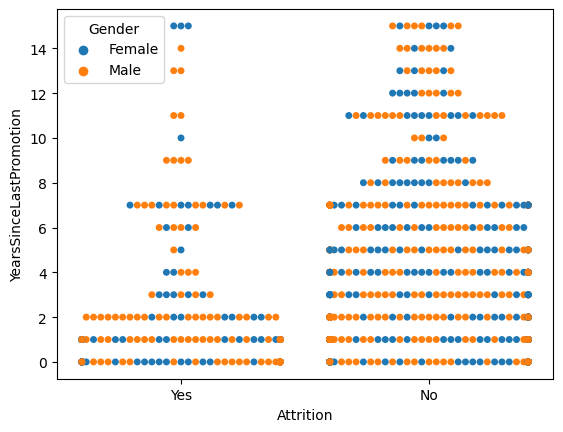

In [203]:
sns.swarmplot(x="Attrition", y="YearsSinceLastPromotion", hue="Gender", data=hr_df)
plt.show()

The Attrition for both male and female employees happen when they do not see promotions happening after years of gaining experience.

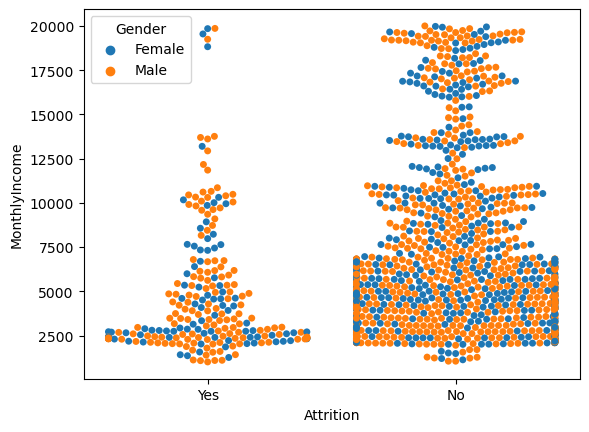

In [127]:
sns.swarmplot(x="Attrition", y="MonthlyIncome", hue="Gender", data=hr_df)
plt.show()

The plot shows that the Attrition peaks for both male and female employees when the monthly income is less than 5000.

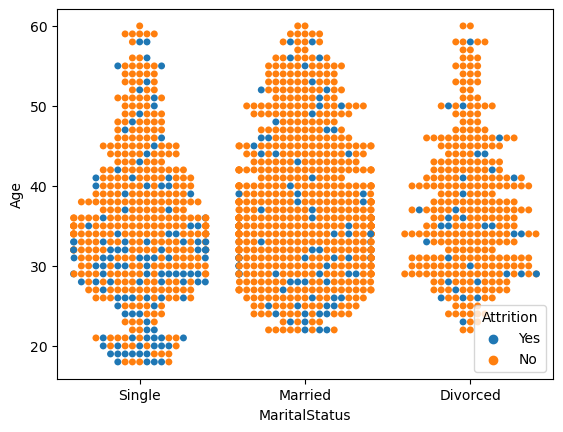

In [128]:
sns.swarmplot(x="MaritalStatus", y="Age", hue="Attrition", data=hr_df)
plt.show()

The swarm plot shows that the Attrition rate is less in employees when they are married or divorced in comparison to when they are single and have lesser responsibilities to deal with at their age.

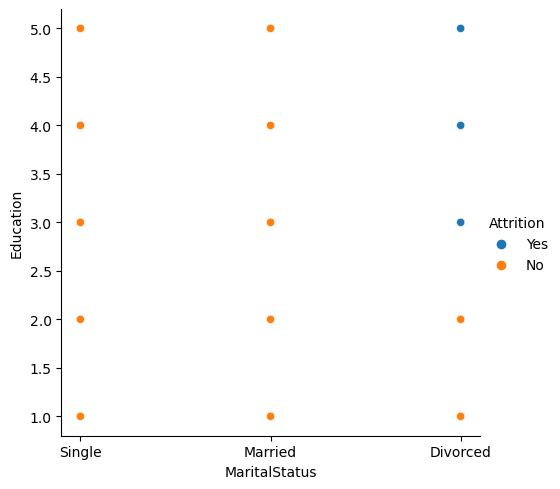

In [204]:
sns.relplot(x="MaritalStatus", y="Education", hue="Attrition", data=hr_df)
plt.show()

The plot show that  employees who are  divorced and with good education make more Attrition compared to married and single 

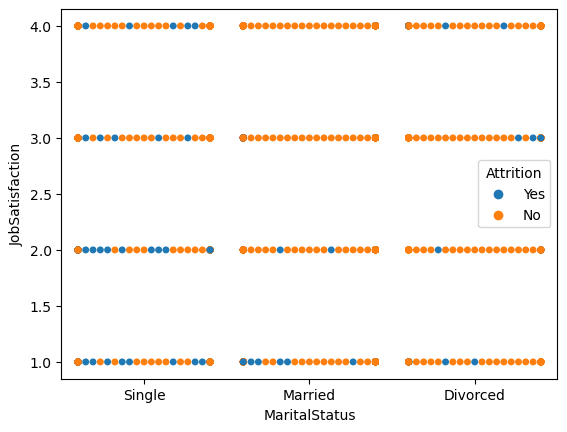

In [130]:
sns.swarmplot(x="MaritalStatus", y="JobSatisfaction", hue="Attrition", data=hr_df)
plt.show()

The above plot show employees who are single with good Jobsactisfaction attribute more compare to Married and Divorce 

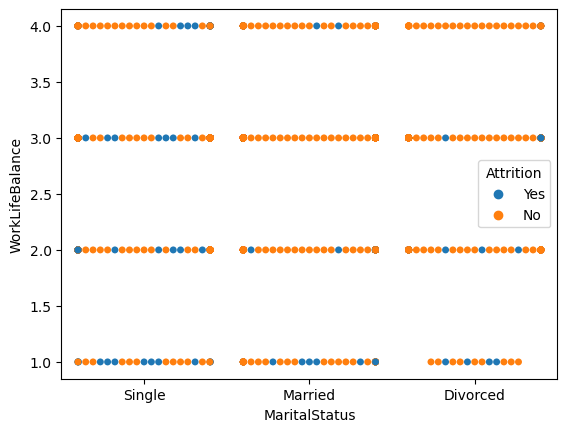

In [131]:
sns.swarmplot(x="MaritalStatus", y="WorkLifeBalance", hue="Attrition", data=hr_df)
plt.show()

The plot shows that Work Life balance style by singles are less, however  attritions noticed they have to skilled up or gain more experince to improved their career.

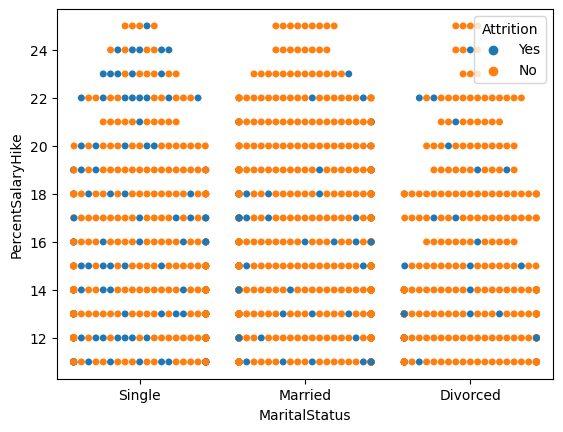

In [132]:
sns.swarmplot(x="MaritalStatus", y="PercentSalaryHike", hue="Attrition", data=hr_df)
plt.show()

The plot shows that the Percent Salary Hike plays a major role when it come to Attrition amongst the Singles as compared to their married or divorced employees.

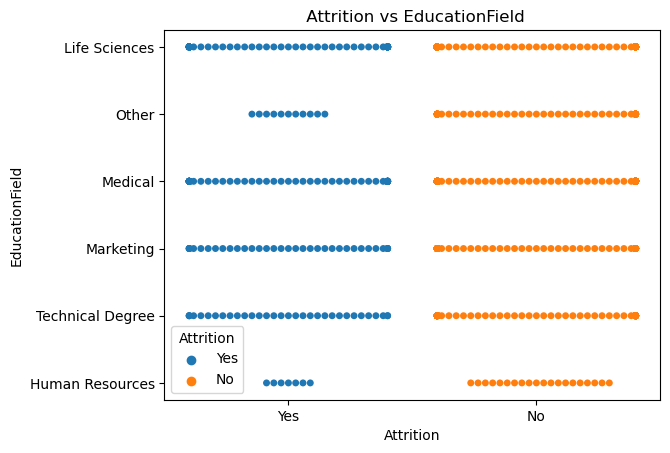

In [133]:
# Checking how the attrition perform according to the employees EducationField
plt.figure()
sns.swarmplot(x='Attrition',y='EducationField', hue = 'Attrition',data =hr_df)
plt.title(" Attrition vs EducationField")
plt.show()

Most of the employees are from Life Sciences background followed by Marketing and Medical. Only few employees in the HR and Other education level have left the company and most of the people stayed still.

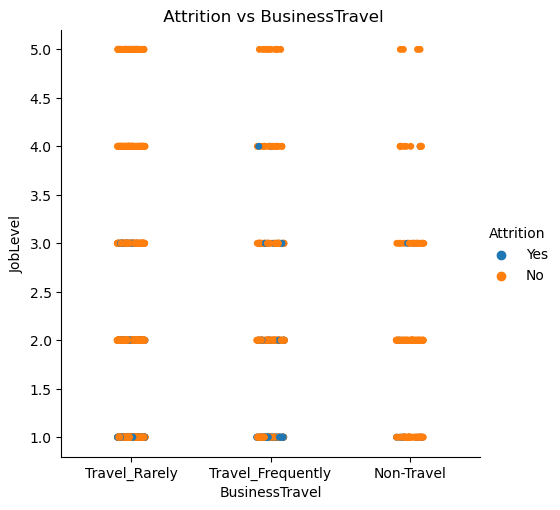

In [134]:
#checking the corelation between 'Attrition' vs 'Business Level'
sns.catplot(x="BusinessTravel",y='JobLevel',data=hr_df,hue="Attrition")
plt.title(" Attrition vs BusinessTravel")
plt.show()

The employees in joblevel 5 who travel rarely are dont want to leave the organization and the employees in the joblevel 4 with non business travel are facing attrition.

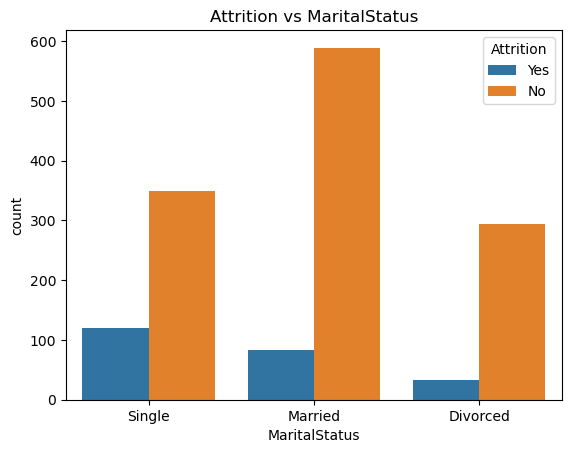

In [135]:
# Checking the relation between 'Attrition' and 'Maritial Status'
plt.figure()
plt.title("Attrition vs MaritalStatus")
sns.countplot(x='MaritalStatus',hue="Attrition",data=hr_df)
plt.show()

singles attrition rate is high,followed by Married employees. it is understood that irrespective of the marital status,there are large people who stay with the company and do not leave.Therefore,marital status is weak predictor of attrition.

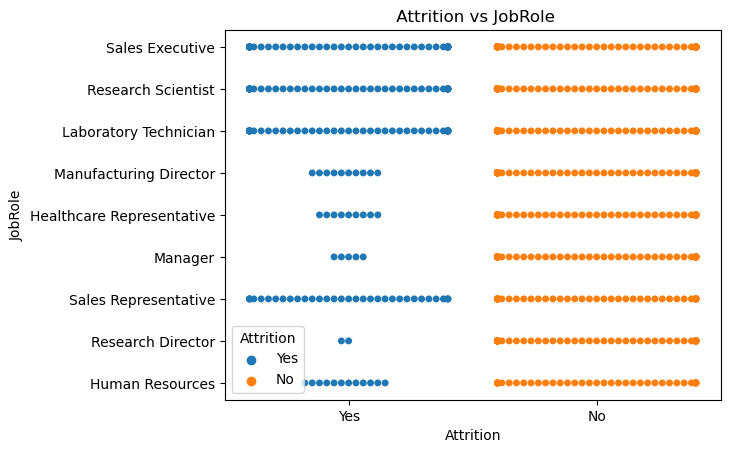

In [136]:
#checking the corelation between the JobRole and Attrition
plt.figure()
plt.title(" Attrition vs JobRole")
sns.swarmplot(x='Attrition',y='JobRole', hue='Attrition', data = hr_df)
plt.show()

The highest attrition is from the Laboratory Technician, Sales Representatives, Sales Executive and Research Scientist.

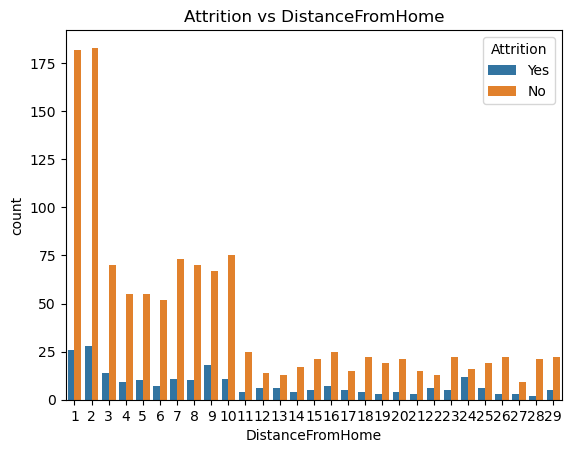

In [137]:
#Checking the corelation between 'Attrition' and travel distance
plt.figure()
plt.title("Attrition vs DistanceFromHome")
sns.countplot(x='DistanceFromHome',hue="Attrition",data=hr_df)
plt.show()

The highest employees stays near to the workplace. The Attrition level is higher here.

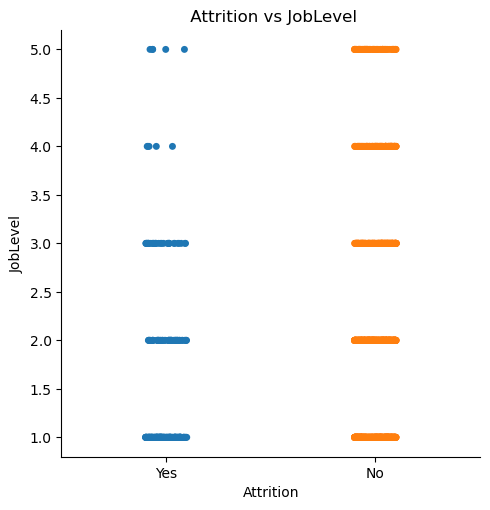

In [138]:
sns.catplot(x="Attrition",y='JobLevel',hue = 'Attrition',data=hr_df)
plt.title(" Attrition vs JobLevel")
plt.show()

Most of the employees in joblevel 4 have high percent of "No" attrition and very less percent for attrition "Yes". Which means most of the employees don't want to leave the company.

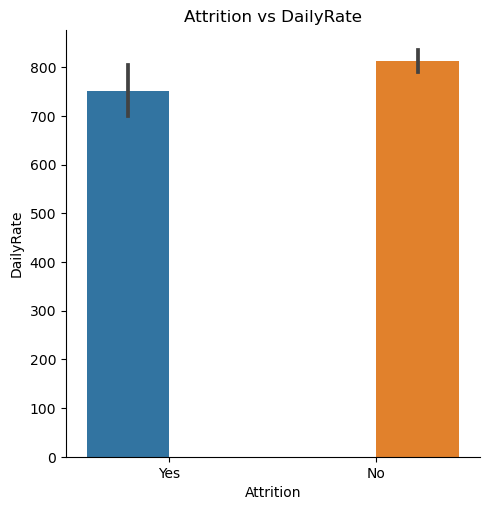

In [139]:
# Checking attrition level in Dailyrate
sns.catplot(x="Attrition",y='DailyRate',hue = 'Attrition', data = hr_df, kind='bar')
plt.title("Attrition vs DailyRate")
plt.show()

Employees working with lower daily rate wants to leave the organization compared to employees working with higher dailyrate.

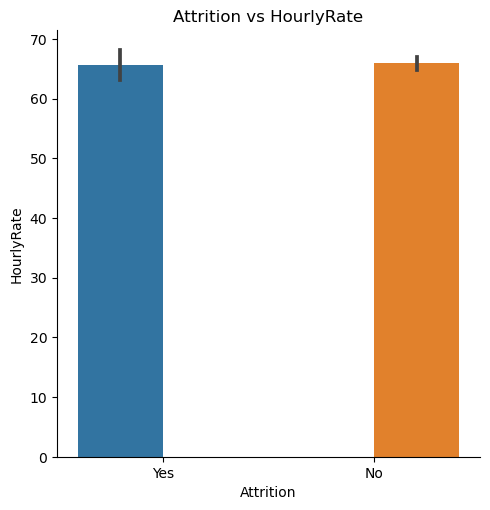

In [140]:
# Checking attrition level in HourlyRate
sns.catplot(x="Attrition",y='HourlyRate', hue = 'Attrition', data = hr_df, kind = 'bar')
plt.title("Attrition vs HourlyRate")
plt.show()

Attrition and HourlyRate looks equal which means there is no significant difference in attrition and hourlyrate, so hourlyrate wont affect the attrition.

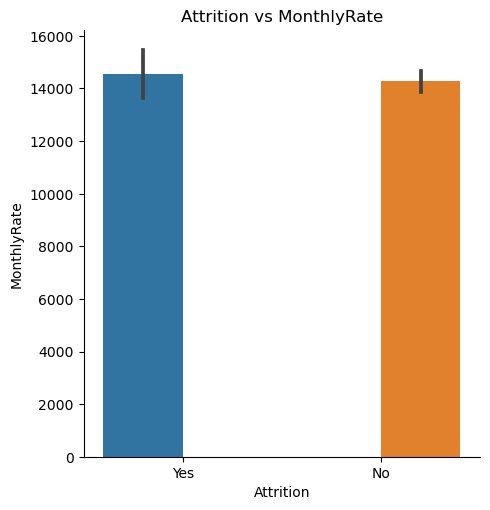

In [141]:
# Checking attrition level in MonthlyRate
sns.catplot(x="Attrition",y='MonthlyRate', hue = 'Attrition', data = hr_df,kind ='bar')
plt.title("Attrition vs MonthlyRate")
plt.show()

MonthlyRate for "Yes" is slightly higher than "No" attrition.

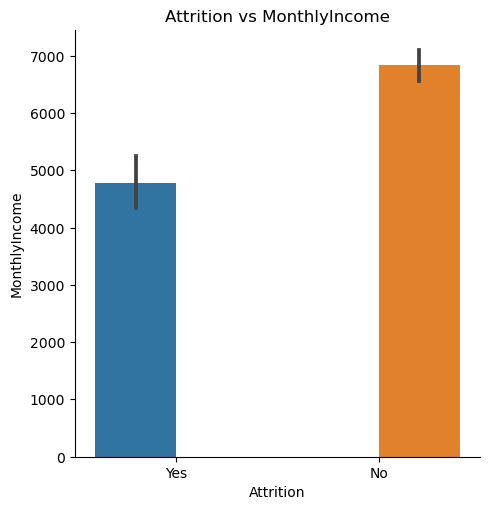

In [142]:
# Checking attrition level in MonthlyIncome
sns.catplot(x="Attrition",y='MonthlyIncome', hue = 'Attrition', data = hr_df, kind='bar')
plt.title("Attrition vs MonthlyIncome")
plt.show()

MonthlyIncome for "No" attrition is quite high than the "Yes" attrition and it is obvious those earning well will certainly not be willing to exit the organisation. Similarly those employees who are probably not earning well will certainly want to leave.

<Figure size 640x480 with 0 Axes>

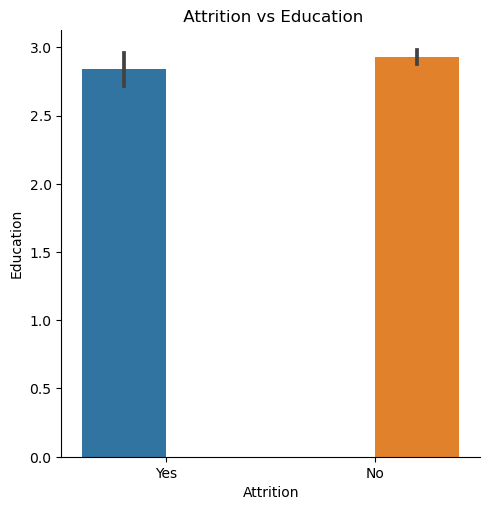

In [143]:
# Checking how attrition effects the education of employees 
plt.figure()
sns.catplot(x="Attrition",y='Education',hue = 'Attrition', data = hr_df, kind = 'bar')
plt.title(" Attrition vs Education")
plt.show()

It is likely that the employees education for "Yes" attrition is less than "No" which means low educated employees facing attrition

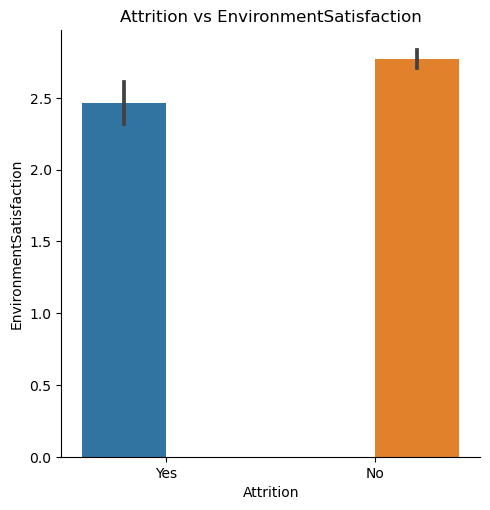

In [144]:
# Checking the counts of EnvironmentSatisfaction
sns.catplot(x='Attrition',y='EnvironmentSatisfaction', hue= 'Attrition', data=hr_df, kind='bar')
plt.title("Attrition vs EnvironmentSatisfaction")
plt.show()

Employee have low enviromentalSactifaction want to leave 

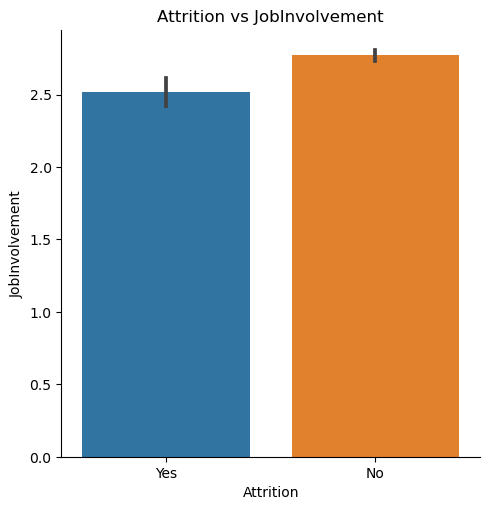

In [145]:
# Checking the counts of JobInvolvement
sns.catplot(x='Attrition',y='JobInvolvement',data=hr_df, kind="bar")
plt.title("Attrition vs JobInvolvement")
plt.show()

From the graph we can notice that the employees in low Jobinvolvement levels wants to leave the organization.

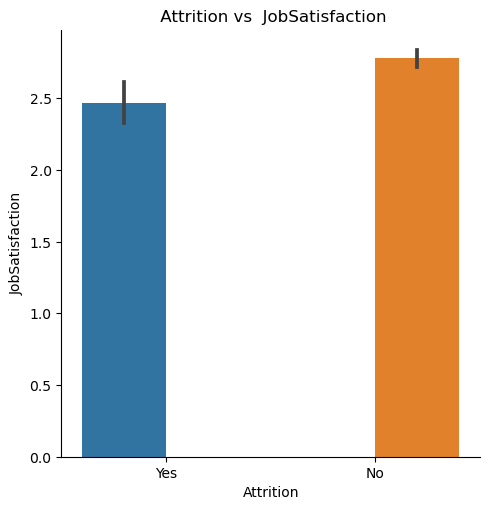

In [146]:
# Checking the counts of JobSatisfaction
sns.catplot(x='Attrition',y='JobSatisfaction',data=hr_df, hue="Attrition", kind="bar")
plt.title(" Attrition vs  JobSatisfaction")
plt.show()

The JobSatisfaction of employees for "Yes" attrition is less, it is obvious that the employees with low JobSatisfaction wants to leave the organization.

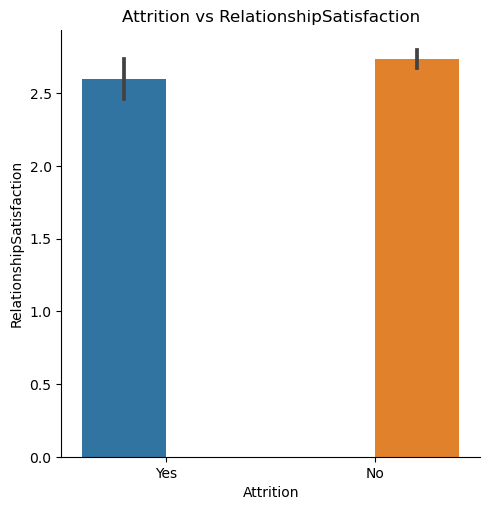

In [147]:
# Checking the counts of RelationshipSatisfaction
sns.catplot(x='Attrition',y='RelationshipSatisfaction',data=hr_df, kind="bar",hue='Attrition')
plt.title("Attrition vs RelationshipSatisfaction")
plt.show()

The employees having high RelationshipSatisfaction are facing the attrition.

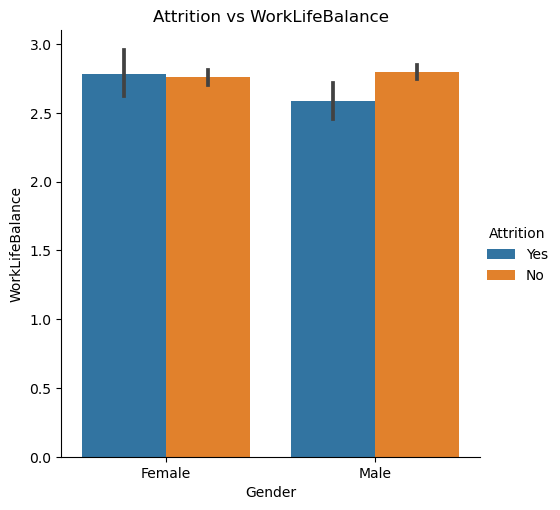

In [148]:
# Checking attrition level in WorkLifeBalance
sns.catplot(x='Gender',y='WorkLifeBalance',data=hr_df,kind="bar",hue='Attrition')
plt.title("Attrition vs WorkLifeBalance")
plt.show()

The female employees with bad WorkLifeBalance facing more attrition compare to male employees. There are more employees in WorkLifeBalance level 2 and 3.

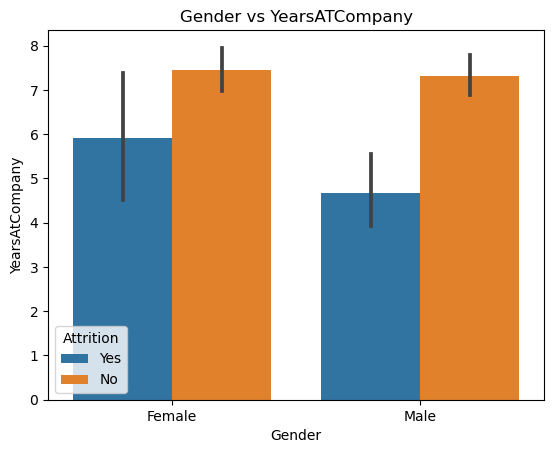

In [149]:
# Checking attrition level in YearsAtCompany
sns.barplot(x='Gender',y='YearsAtCompany',data=hr_df,hue='Attrition')
plt.title('Gender vs YearsATCompany')
plt.show()

<Axes: xlabel='Gender', ylabel='TotalWorkingYears'>

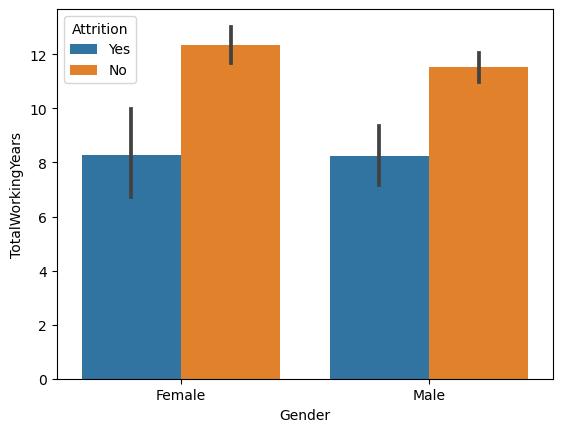

In [150]:
# Checking attrition level in TotalWorkingYears
sns.barplot(x='Gender',y='TotalWorkingYears',data=hr_df,hue='Attrition')

<Axes: xlabel='Gender', ylabel='YearsInCurrentRole'>

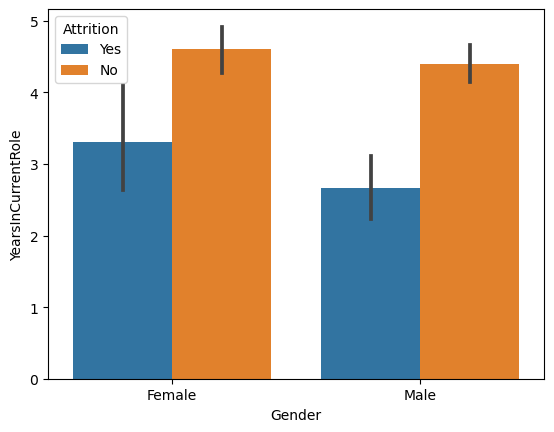

In [151]:
# Checking attrition level in YearsInCurrentRole
sns.barplot(x='Gender',y='YearsInCurrentRole',data=hr_df,hue='Attrition')

<Axes: xlabel='Gender', ylabel='YearsSinceLastPromotion'>

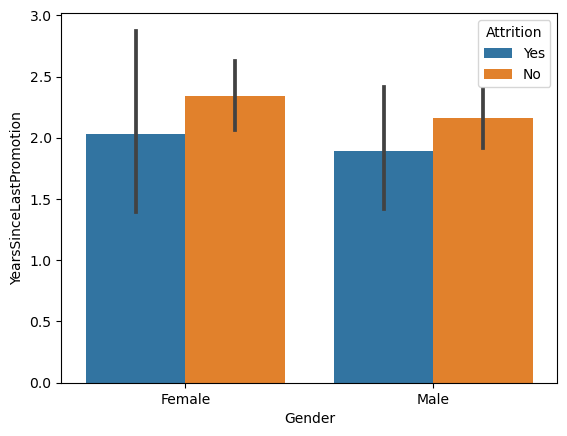

In [152]:
# Checking attrition level in YearsSinceLastPromotion
sns.barplot(x='Gender',y='YearsSinceLastPromotion',data=hr_df,hue='Attrition')

Female employees are spending more years at company tan male but the "Yes" attrition for female employees are more than male. However same with the  above for Total Working Years of female employees which is more than that of male employees and the "Yes" attrition for male and female employees are same. Here also the female employees spending more years in the current organization in comparison to male employees and also they are facing attrition. The female employees spend more years since their last promotion than male. From the above observation we can say that the spending years of female employees is more than male and they wants to quit the organization.

<Figure size 640x480 with 0 Axes>

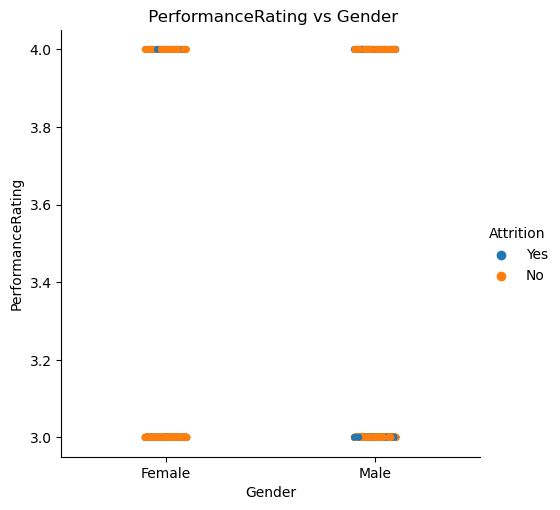

In [153]:
# Let's check how the performance rating afecting the attrition level
plt.figure()
sns.catplot(x='Gender',y='PerformanceRating',data=hr_df,hue='Attrition')
plt.title(" PerformanceRating vs Gender")
plt.show()

Attrition affecting but female and male are equal, no difference 

The two above plot looks unwanted including Over18, remeber they have unique values of 1 each so I will be droppping them  

In [9]:
# Dropping irrelevant columns
hr_df.drop(columns=["EmployeeCount", "Over18", "StandardHours", "EmployeeNumber"], axis=1, inplace=True)

In [10]:
print(hr_df.shape)

(1470, 31)


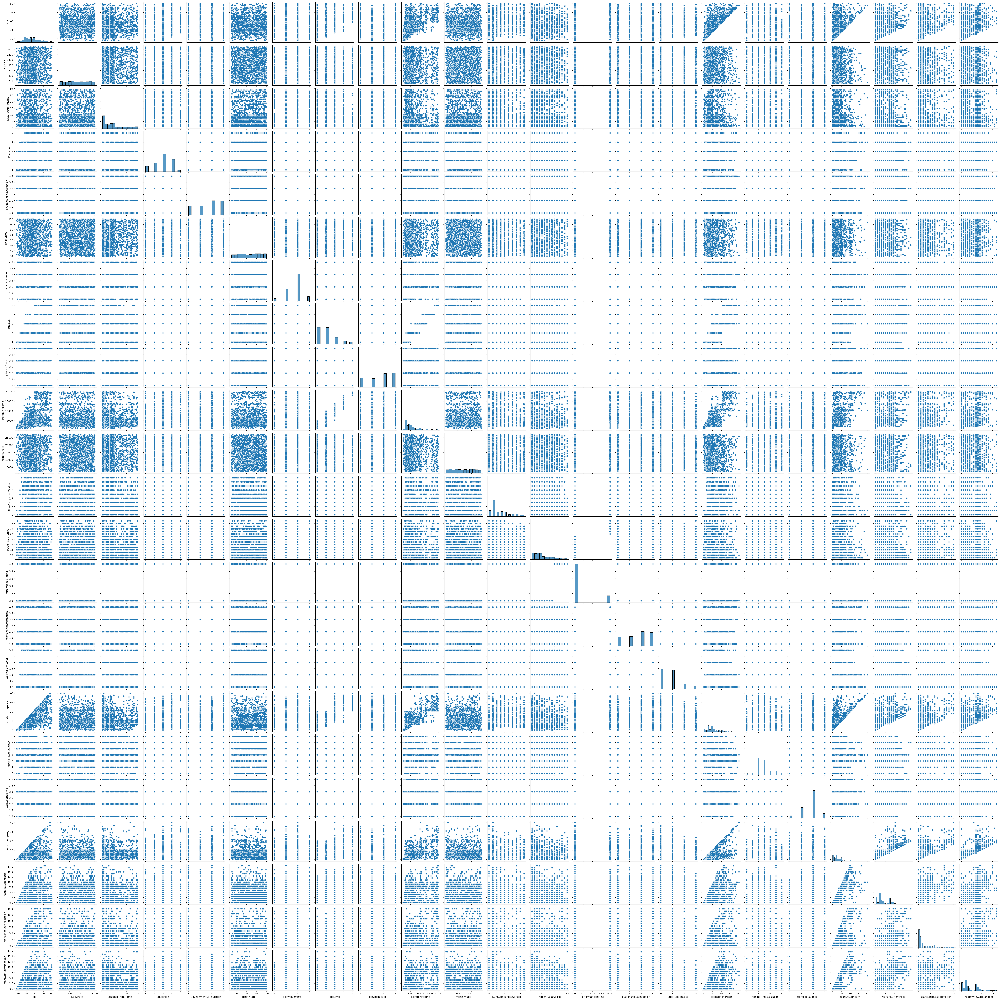

In [60]:
# Checking the pairwise relation in the dataset.
sns.pairplot(hr_df)

In [11]:
# creating new variable for numerical columns 

num_col_1=[]
for i in hr_df.dtypes.index:
    if hr_df.dtypes[i]=='int64':
        num_col_1.append(i)
print('\nnumerical columns', num_col_1)
print('number of numerical', len(num_col_1))


numerical columns ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']
number of numerical 23


#  Distribution plot of the data by observing the skewness 

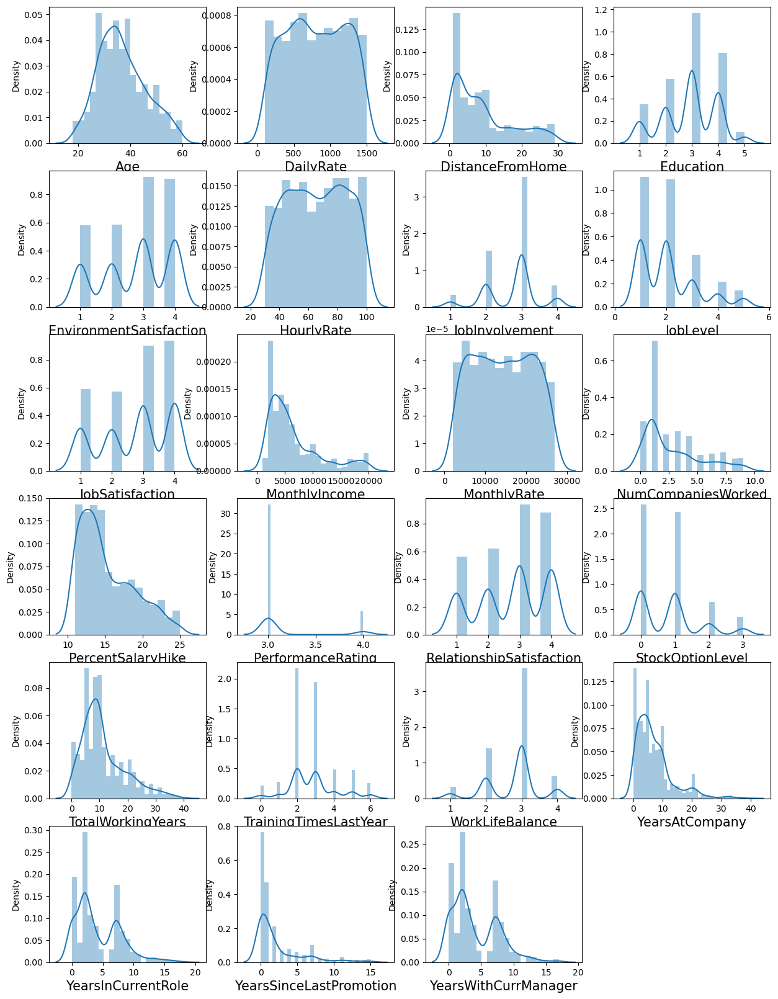


 sorted skewness WorkLifeBalance            -0.552480
JobInvolvement             -0.498419
JobSatisfaction            -0.329672
EnvironmentSatisfaction    -0.321654
RelationshipSatisfaction   -0.302828
Education                  -0.289681
HourlyRate                 -0.032311
DailyRate                  -0.003519
MonthlyRate                 0.018578
Age                         0.413286
TrainingTimesLastYear       0.553124
PercentSalaryHike           0.821128
YearsWithCurrManager        0.833451
YearsInCurrentRole          0.917363
DistanceFromHome            0.958118
StockOptionLevel            0.968980
JobLevel                    1.025401
NumCompaniesWorked          1.026471
TotalWorkingYears           1.117172
MonthlyIncome               1.369817
YearsAtCompany              1.764529
PerformanceRating           1.921883
YearsSinceLastPromotion     1.984290
dtype: float64


In [157]:
# Checking the distribution of the data
plt.figure(figsize=(15,20))
plotnumber = 1
for column in num_col_1:
    if plotnumber <= 23:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(hr_df[column])
        plt.xlabel(column,fontsize= 15)
    plotnumber +=1
plt.show()
print('\n sorted skewness',hr_df.skew().sort_values())

skewness columns are numerical columns from +0.5 and -0.5, however the below columns have skewness present..
- DistanceFromHome JobInvolvement JobLevel MonthlyIncome NumCompaniesWorked PercentSalaryHike PerformanceRating StockOptionLevel TotalWorkingYears TrainingTimesLastYear WorkLifeBalance YearsAtCompany YearsInCurrentRole YearsWithCurrManager YearsSinceLastPromotion.PerformanceRating and WorkLifeBalance are categorical columns, so no need to remove skewness in these columns.

# Checking Outliers with Box Plot

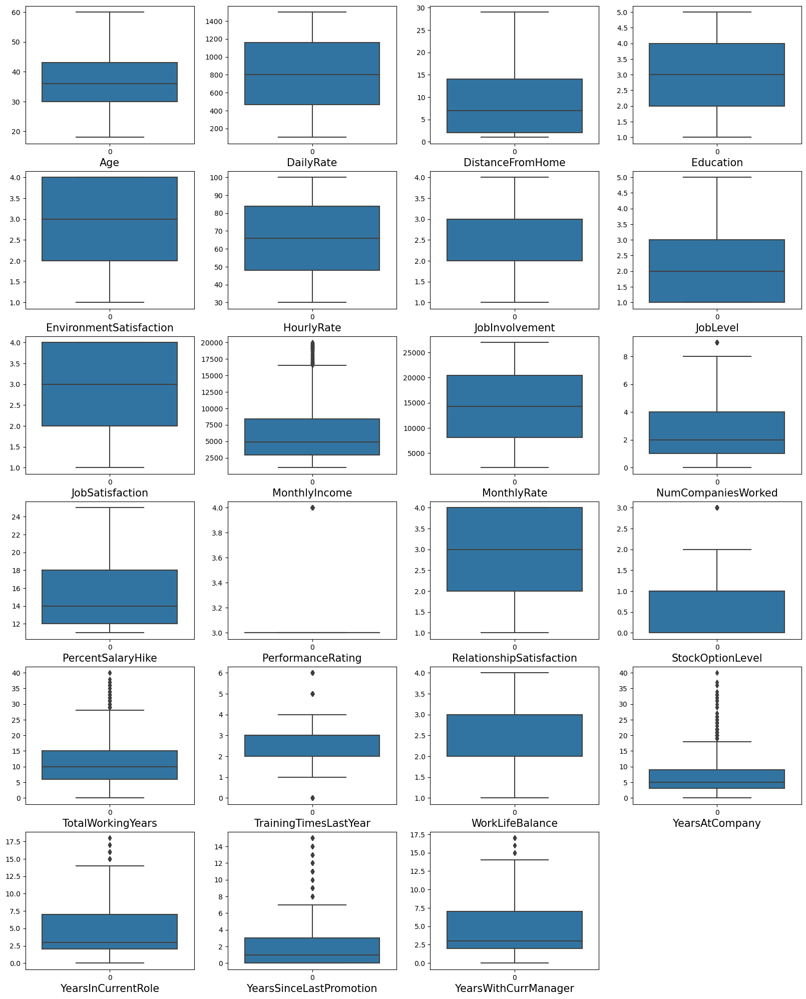

In [158]:
# Using distribution plot to find outliers 
plt.figure(figsize=(20,25))
plotnumber = 1
for column in num_col_1:
    if plotnumber <= 23:
        ax = plt.subplot(6,4,plotnumber)
        sns.boxplot(hr_df[column])
        plt.xlabel(column,fontsize= 15)
    plotnumber +=1
plt.show()

The above box plot shows some columns have outliers present. Below are the columns name 
MonthlyIncome, NumCompanyWorked, PerformanceRating, StockOptionLevl,TotalWorkingYears, TrainingTimesYear, YearsAtCompany,YearsCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager

# Outliers Removal Using Zscore

In [12]:
# Creating variable to store features with outliers 
out_features = hr_df[['MonthlyIncome','NumCompaniesWorked','PerformanceRating','StockOptionLevel','TotalWorkingYears','TrainingTimesLastYear','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']]


In [13]:
from scipy.stats import zscore
z=np.abs(zscore(out_features))
print(z)
threshold=3
hr_df1=hr_df[(z<3).all(axis=1)]

hr_df1.head()
print('Old Data Frame:', hr_df.shape[0])
print('New Data Frame:', hr_df1.shape[0])
print('percentage of loss of data by zscore is :',(hr_df.shape[0]-hr_df1.shape[0])/hr_df.shape[0])

      MonthlyIncome  NumCompaniesWorked  PerformanceRating  StockOptionLevel  \
0          0.108350            2.125136           0.426230          0.932014   
1          0.291719            0.678049           2.346151          0.241988   
2          0.937654            1.324226           0.426230          0.932014   
3          0.763634            0.678049           0.426230          0.932014   
4          0.644858            2.525591           0.426230          0.241988   
...             ...                 ...                ...               ...   
1465       0.835451            0.523316           0.426230          0.241988   
1466       0.741140            0.523316           0.426230          0.241988   
1467       0.076690            0.678049           2.346151          0.241988   
1468       0.236474            0.277594           0.426230          0.932014   
1469       0.445978            0.277594           0.426230          0.932014   

      TotalWorkingYears  TrainingTimesL

After removing the outliers using Zscore method we lost 0.056% of our data which is not up to 10% of our data which is fine. 

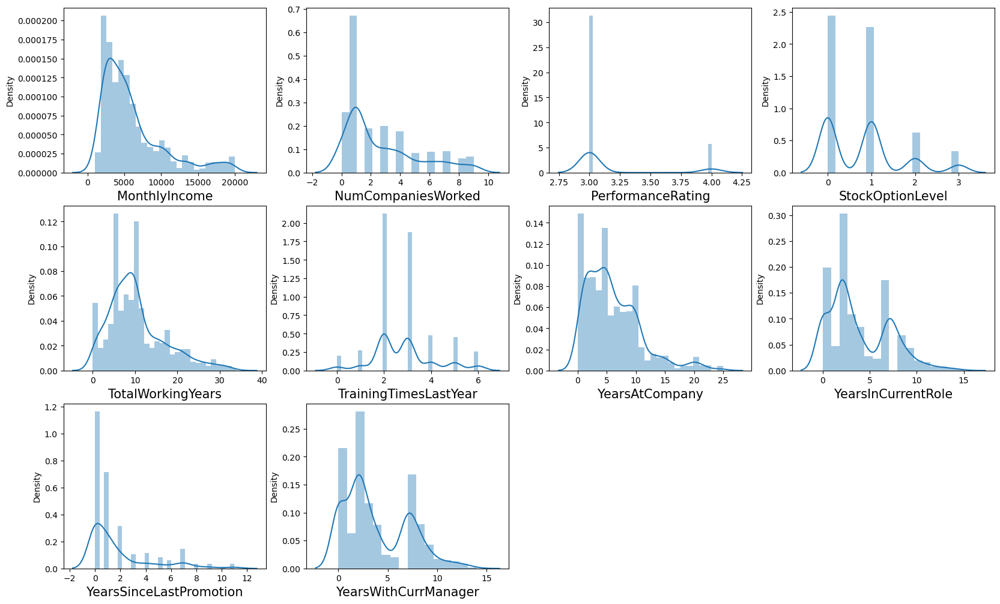

In [161]:
# Using distribution plot to find outliers 
plt.figure(figsize=(20,25))
plotnumber = 1
for column in out_features:
    if plotnumber <= 23:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(hr_df1[column])
        plt.xlabel(column,fontsize= 15)
    plotnumber +=1
plt.show()

The data fellowed a bell shape curve, that is the data look almost normally distributed. 

## Checking Skewness after removing Outliers

In [162]:
hr_df.skew().sort_values()

WorkLifeBalance            -0.552480
JobInvolvement             -0.498419
JobSatisfaction            -0.329672
EnvironmentSatisfaction    -0.321654
RelationshipSatisfaction   -0.302828
Education                  -0.289681
HourlyRate                 -0.032311
DailyRate                  -0.003519
MonthlyRate                 0.018578
Age                         0.413286
TrainingTimesLastYear       0.553124
PercentSalaryHike           0.821128
YearsWithCurrManager        0.833451
YearsInCurrentRole          0.917363
DistanceFromHome            0.958118
StockOptionLevel            0.968980
JobLevel                    1.025401
NumCompaniesWorked          1.026471
TotalWorkingYears           1.117172
MonthlyIncome               1.369817
YearsAtCompany              1.764529
PerformanceRating           1.921883
YearsSinceLastPromotion     1.984290
dtype: float64

Columns from +0.5 & -0.5 shows it contains skews. Below are the columns 

TrainingTimesLastYear PercentSalaryHike YearsWithCurrManager YearsInCurrentRole DistanceFromHome JobInvolvement JobLevel MonthlyIncome NumCompaniesWorked  PerformanceRating StockOptionLevel TotalWorkingYears  WorkLifeBalance YearsAtCompany   YearsSinceLastPromotion but we will not remove skewness from the categorical columns like PerformanceRating and WorkLifeBalane 

# Removing skewness using CubeRoot Method 

In [14]:
hr_df1['TrainingTimesLastYear'] = np.cbrt(hr_df1['TrainingTimesLastYear'])
hr_df1['PercentSalaryHike'] = np.cbrt(hr_df1['PercentSalaryHike'])
hr_df1['YearsWithCurrManager'] = np.cbrt(hr_df1['YearsWithCurrManager'])
hr_df1['YearsInCurrentRole'] = np.cbrt(hr_df1['YearsInCurrentRole'])
hr_df1['DistanceFromHome '] = np.cbrt(hr_df1['DistanceFromHome'])
hr_df1['JobInvolvement'] = np.cbrt(hr_df1['JobInvolvement'])
hr_df1['JobLevel'] = np.cbrt(hr_df1['JobLevel'])
hr_df1['MonthlyIncome'] = np.cbrt(hr_df1['MonthlyIncome'])
hr_df1['NumCompaniesWorked'] = np.cbrt(hr_df1['NumCompaniesWorked'])
hr_df1['StockOptionLevel'] = np.cbrt(hr_df1['StockOptionLevel'])
hr_df1['TotalWorkingYears'] = np.cbrt(hr_df1['TotalWorkingYears'])
hr_df1['YearsAtCompany'] = np.cbrt(hr_df1['YearsAtCompany'])
hr_df1['YearsSinceLastPromotion'] = np.cbrt(hr_df1['YearsSinceLastPromotion'])
print('After removing skewness\n', hr_df1.skew().sort_values())

After removing skewness
 TrainingTimesLastYear      -2.488197
JobInvolvement             -1.135894
YearsInCurrentRole         -0.884938
YearsWithCurrManager       -0.819914
YearsAtCompany             -0.700051
NumCompaniesWorked         -0.689329
TotalWorkingYears          -0.563399
WorkLifeBalance            -0.557100
JobSatisfaction            -0.345612
EnvironmentSatisfaction    -0.325285
RelationshipSatisfaction   -0.295686
Education                  -0.289024
StockOptionLevel           -0.131820
HourlyRate                 -0.030481
DailyRate                  -0.017078
MonthlyRate                 0.030596
YearsSinceLastPromotion     0.157801
DistanceFromHome            0.183373
Age                         0.472280
JobLevel                    0.508238
PercentSalaryHike           0.582921
MonthlyIncome               0.742985
DistanceFromHome            0.954752
PerformanceRating           1.931566
dtype: float64


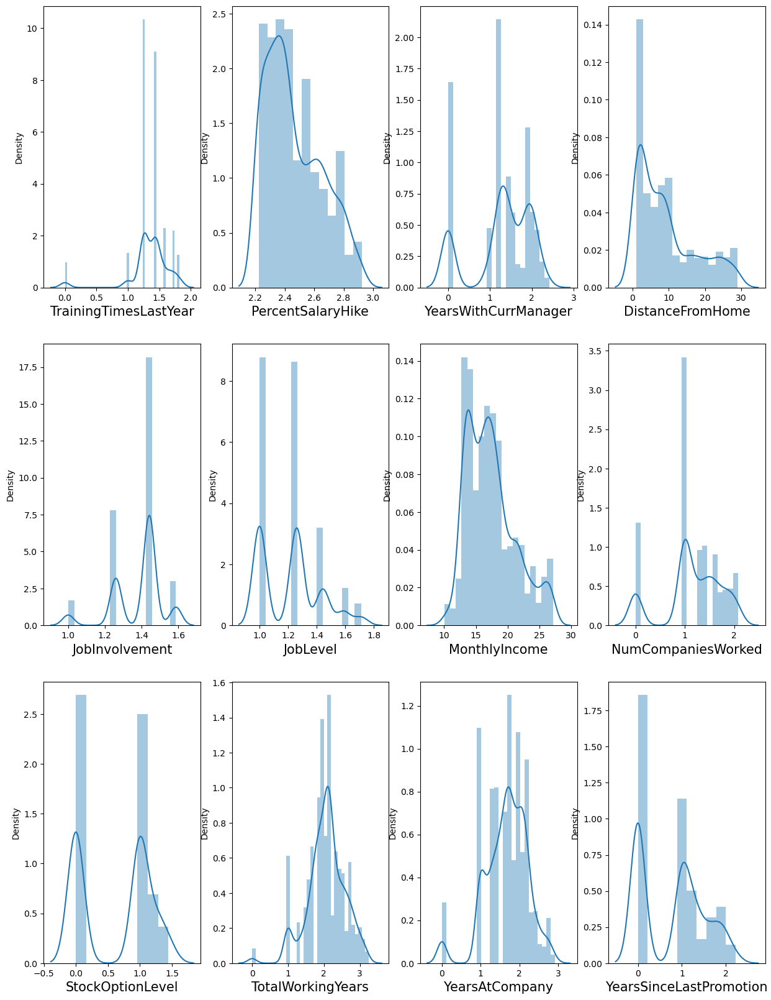

In [164]:
# After removing skewness lets check the data distribution 

plt.figure(figsize=(15,20))
plotnumber = 1
for column in hr_df1[['TrainingTimesLastYear','PercentSalaryHike','YearsWithCurrManager','DistanceFromHome','JobInvolvement','JobLevel','MonthlyIncome','NumCompaniesWorked','StockOptionLevel','TotalWorkingYears','YearsAtCompany','YearsSinceLastPromotion']]:
    if plotnumber <= 23:
        ax = plt.subplot(3,4,plotnumber)
        sns.distplot(hr_df1[column])
        plt.xlabel(column,fontsize= 15)
    plotnumber +=1
plt.show()

The distribution again look almost normal.

## Encoding the categorical columns using Label Encoding

In [15]:
from sklearn.preprocessing import LabelEncoder

In [16]:
categorical_columns = ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'OverTime']

In [17]:
lab_enc=LabelEncoder()
hr_df1[categorical_columns]= hr_df1[categorical_columns].apply(lab_enc.fit_transform)

hr_df1[categorical_columns]

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,1,2,2,1,0,7,2,1
1,0,1,1,1,1,6,1,0
2,1,2,1,4,1,2,2,1
3,0,1,1,1,0,6,1,1
4,0,2,1,3,1,2,1,0
...,...,...,...,...,...,...,...,...
1465,0,1,1,3,1,2,1,0
1466,0,2,1,3,1,0,1,0
1467,0,2,1,1,1,4,1,1
1468,0,1,2,3,1,7,1,0


columns encoded successfully 

# Correlation 

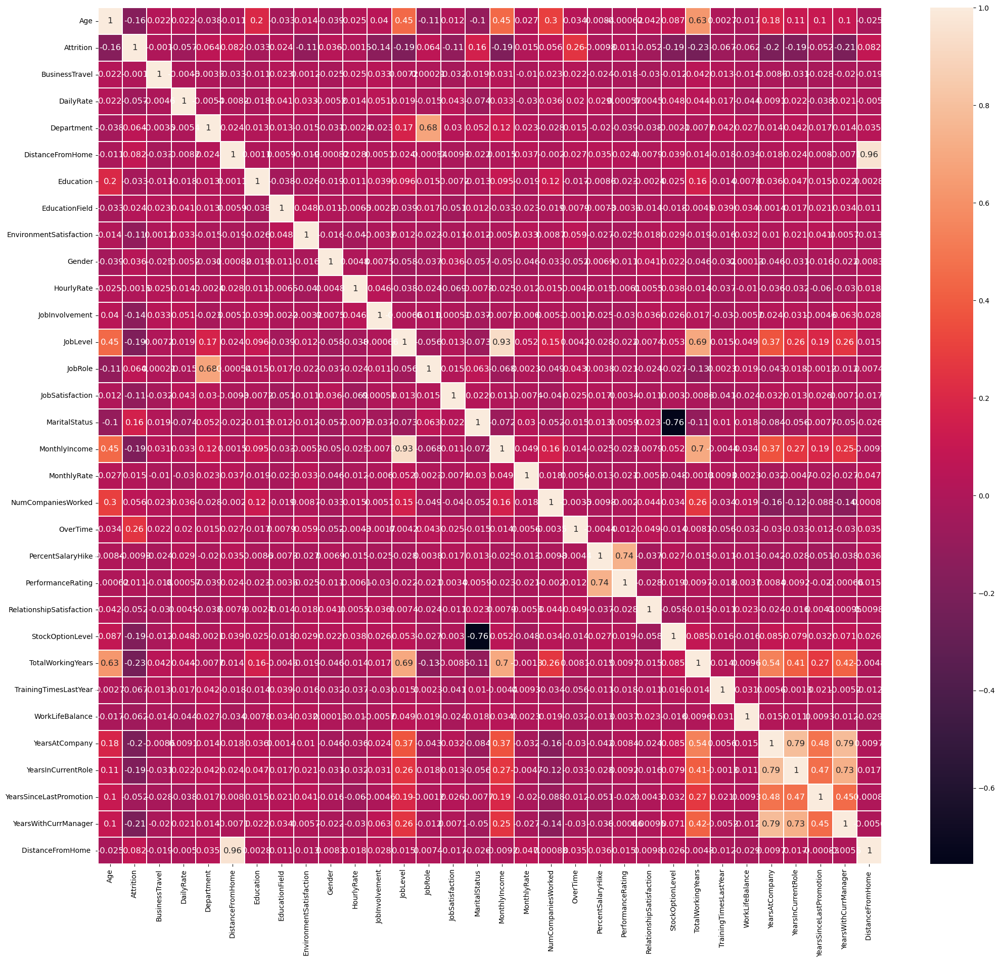

In [87]:
# Ploting the heatmap of correlation between the features and Multicorrilinearity problem.
plt.figure(figsize=(25,22))
sns.heatmap(hr_df1.corr(),linewidths=.2, annot = True, annot_kws={'size':12})
plt.show()

Note we are looking for multicollinearity problem, the brighter the heapmap that confirms there is multicollinearity problem. 
According to the heapmap result we noticed that JobLevel and MonthlyIncome are 0.93% which is the brightest almost close to 1, which mean they are correlated. However, both features are dependant, maybe one increases the other directly increases. Ths is a direct relation between JobLevel and MonthlyIncome. This is what I am seeing in the heatmap. Lets be sure they are really correlated if fellowing the trend ploting scatter plot.  

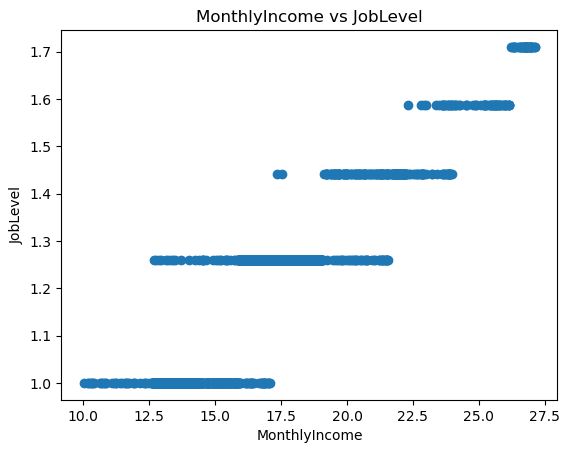

In [168]:
# checking trend between two features using scatter plots. 
plt.scatter(hr_df1.MonthlyIncome, hr_df1.JobLevel)
plt.xlabel('MonthlyIncome')
plt.ylabel('JobLevel')
plt.title('MonthlyIncome vs JobLevel')
plt.show()

According to the result of the scatter plot it confirmed to us that if Joblevel increases the MonthlyIncome is increasing.This means they are directly correlated to each other. In this case we are deleting one of them. 

In [18]:
# Dropping irrelevant column
hr_df1.drop("JobLevel",axis=1, inplace=True)

In [19]:
hr_df1.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DistanceFromHome
0,41,1,2,1102,2,1,2,1,2,0,...,1,0.0,2.000000,0.00000,1,1.817121,1.587401,0.000000,1.709976,1.000000
1,49,0,1,279,1,8,1,1,3,1,...,4,1.0,2.154435,1.44225,3,2.154435,1.912931,1.000000,1.912931,2.000000
2,37,1,2,1373,1,2,2,4,4,1,...,2,0.0,1.912931,1.44225,3,0.000000,0.000000,0.000000,0.000000,1.259921
3,33,0,1,1392,1,3,4,1,4,0,...,3,0.0,2.000000,1.44225,3,2.000000,1.912931,1.442250,0.000000,1.442250
4,27,0,2,591,1,2,1,3,1,1,...,4,1.0,1.817121,1.44225,3,1.259921,1.259921,1.259921,1.259921,1.259921


# Spliting the Data into Features and Label

In [20]:
# Droping label 
x = hr_df1.drop("Attrition", axis=1)
y = hr_df1["Attrition"]

In [21]:
print(len(x),len(y))

1387 1387


x and y have same length in terms of rows 

In [22]:
x.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,DistanceFromHome
0,41,2,1102,2,1,2,1,2,0,94,...,1,0.0,2.000000,0.00000,1,1.817121,1.587401,0.000000,1.709976,1.000000
1,49,1,279,1,8,1,1,3,1,61,...,4,1.0,2.154435,1.44225,3,2.154435,1.912931,1.000000,1.912931,2.000000
2,37,2,1373,1,2,2,4,4,1,92,...,2,0.0,1.912931,1.44225,3,0.000000,0.000000,0.000000,0.000000,1.259921
3,33,1,1392,1,3,4,1,4,0,56,...,3,0.0,2.000000,1.44225,3,2.000000,1.912931,1.442250,0.000000,1.442250
4,27,2,591,1,2,1,3,1,1,40,...,4,1.0,1.817121,1.44225,3,1.259921,1.259921,1.259921,1.259921,1.259921


In [23]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: Attrition, dtype: int32

In [24]:
# Counter module to count each class
from collections import Counter
Counter(y)

Counter({1: 229, 0: 1158})

Our label data is imbalance, 0 class is more than the 1 class. To balance the data we are using SMOTE Method 

In [25]:
# importing over smapling 
from imblearn.over_sampling import SMOTE

In [26]:
ove_smp=SMOTE(random_state=41,k_neighbors=3,sampling_strategy=1) # 75% of your majority to be balance. 
x,y=ove_smp.fit_resample(x,y)

print("The number of classes before fit {}".format(Counter(y)))
print("The number of Classes after fit {}".format(Counter(y)))


The number of classes before fit Counter({1: 1158, 0: 1158})
The number of Classes after fit Counter({1: 1158, 0: 1158})


In [39]:
print(y.value_counts())
print('Label data is balanced')
print('\nEnd of preprocessing steps')

1    1158
0    1158
Name: Attrition, dtype: int64
Label data is balanced

End of preprocessing steps


# Model Building/Machine Learning 


In [56]:
#Importing the neccessary Libaries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV


# Finding the best random state 

In [36]:
dtc = DecisionTreeClassifier()
maxAccu=0 # Maximum Accuuracy
maxRS=0 # Best Random State
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=i)
    dtc = DecisionTreeClassifier()
    dtc.fit(x_train, y_train)
    pred=dtc.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is ',maxAccu,'on random state',maxRS)

Best accuracy is  0.8704663212435233 on random state 30


Decision Tree Classifier gave us the best accuracy at the best random state of 30. 

### Creating funtion to call model

In [37]:
# creating a function to run all the classifiers

def classifier(model, x, y):
    x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=30)  # random_state 160 was the best random_state
    
    # Training the model
    model.fit(x_train, y_train)
    print ("The training score is: ",(model.score(x_train, y_train))*100) # Training Score
    
    # Predicting y_test
    pred = model.predict(x_test)
    print ("The testing score is: ",model.score(x_test, y_test)*100) # Testing Score
    
    # Accuracy Score
    acc_score = (accuracy_score(y_test, pred))*100
    print("Accuracy Score:", acc_score)
    
    # Confusion Matrix f1 score 
    print("The Confusion Matrix is: \n", confusion_matrix(y_test, pred))
    print ('\n')
    
    # Classification Report
    class_report = classification_report(y_test, pred)
    print("\nClassification Report:\n", class_report)
    
    # Cross Validation Score
    cv_score = (cross_val_score(model, x, y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    
    # Result of accuracy minus cv scores
    result = acc_score - cv_score
    print("\nAccuracy Score - Cross Validation Score is", result)

# Logistic Regression Model 

In [38]:
model = LogisticRegression()
classifier(model, x, y)

The training score is:  70.62634989200865
The testing score is:  72.41379310344827
Accuracy Score: 72.41379310344827
The Confusion Matrix is: 
 [[170  63]
 [ 65 166]]



Classification Report:
               precision    recall  f1-score   support

           0       0.72      0.73      0.73       233
           1       0.72      0.72      0.72       231

    accuracy                           0.72       464
   macro avg       0.72      0.72      0.72       464
weighted avg       0.72      0.72      0.72       464

Cross Validation Score: 68.00821106725256

Accuracy Score - Cross Validation Score is 4.40558203619571


# DecisionTree Classifier Model 

In [39]:
model = DecisionTreeClassifier()
classifier(model, x, y)

The training score is:  100.0
The testing score is:  82.97413793103449
Accuracy Score: 82.97413793103449
The Confusion Matrix is: 
 [[178  55]
 [ 24 207]]



Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.76      0.82       233
           1       0.79      0.90      0.84       231

    accuracy                           0.83       464
   macro avg       0.84      0.83      0.83       464
weighted avg       0.84      0.83      0.83       464

Cross Validation Score: 80.96577791018099

Accuracy Score - Cross Validation Score is 2.0083600208535017


# AdaBoost Classifier Model

In [40]:
model =  AdaBoostClassifier()
classifier(model, x, y)

The training score is:  90.76673866090714
The testing score is:  88.36206896551724
Accuracy Score: 88.36206896551724
The Confusion Matrix is: 
 [[203  30]
 [ 24 207]]



Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.87      0.88       233
           1       0.87      0.90      0.88       231

    accuracy                           0.88       464
   macro avg       0.88      0.88      0.88       464
weighted avg       0.88      0.88      0.88       464

Cross Validation Score: 84.85737692708722

Accuracy Score - Cross Validation Score is 3.504692038430022


# KNeighborsClassifier Model 

In [41]:
model =  KNeighborsClassifier()
classifier(model, x, y)

The training score is:  82.88336933045356
The testing score is:  74.56896551724138
Accuracy Score: 74.56896551724138
The Confusion Matrix is: 
 [[144  89]
 [ 29 202]]



Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.62      0.71       233
           1       0.69      0.87      0.77       231

    accuracy                           0.75       464
   macro avg       0.76      0.75      0.74       464
weighted avg       0.76      0.75      0.74       464

Cross Validation Score: 74.65470693379011

Accuracy Score - Cross Validation Score is -0.08574141654872847


In [42]:
# RandomForestClassifier Model

In [43]:
model =  RandomForestClassifier()
classifier(model,x, y)

The training score is:  100.0
The testing score is:  92.24137931034483
Accuracy Score: 92.24137931034483
The Confusion Matrix is: 
 [[222  11]
 [ 25 206]]



Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.95      0.93       233
           1       0.95      0.89      0.92       231

    accuracy                           0.92       464
   macro avg       0.92      0.92      0.92       464
weighted avg       0.92      0.92      0.92       464

Cross Validation Score: 89.65005213376033

Accuracy Score - Cross Validation Score is 2.5913271765844996


# SVC Model 

In [44]:
model =  SVC()
classifier(model,x, y)

The training score is:  50.377969762419006
The testing score is:  46.98275862068966
Accuracy Score: 46.98275862068966
The Confusion Matrix is: 
 [[128 105]
 [141  90]]



Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.55      0.51       233
           1       0.46      0.39      0.42       231

    accuracy                           0.47       464
   macro avg       0.47      0.47      0.47       464
weighted avg       0.47      0.47      0.47       464

Cross Validation Score: 48.14329336411708

Accuracy Score - Cross Validation Score is -1.1605347434274194


# GradientBoostingClassifier Model

In [45]:
model =  GradientBoostingClassifier()
classifier(model,x, y)

The training score is:  96.38228941684666
The testing score is:  92.67241379310344
Accuracy Score: 92.67241379310344
The Confusion Matrix is: 
 [[223  10]
 [ 24 207]]



Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.96      0.93       233
           1       0.95      0.90      0.92       231

    accuracy                           0.93       464
   macro avg       0.93      0.93      0.93       464
weighted avg       0.93      0.93      0.93       464

Cross Validation Score: 87.36370745512772

Accuracy Score - Cross Validation Score is 5.308706337975721


# ExtraTreesClassifier Model 

In [46]:
model =  ExtraTreesClassifier()
classifier(model,x, y)

The training score is:  100.0
The testing score is:  94.18103448275862
Accuracy Score: 94.18103448275862
The Confusion Matrix is: 
 [[223  10]
 [ 17 214]]



Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.96      0.94       233
           1       0.96      0.93      0.94       231

    accuracy                           0.94       464
   macro avg       0.94      0.94      0.94       464
weighted avg       0.94      0.94      0.94       464

Cross Validation Score: 90.85490057347137

Accuracy Score - Cross Validation Score is 3.3261339092872504


Extra Trees is the best model because it has 3rd least score between the difference in cv and accuracy but the highest scores cv and accracy compare to other models.  

# Hyper Parameter  Tuning for Extra Trees Classifier

In [47]:
# parameters list to pass into GridSearchCV

parameters = {'criterion' : ['gini', 'entropy'],
              'max_features' : ['auto', 'sqrt', 'log2'],
              'n_jobs' : [5, 15, 15],
              'random_state' : [None, 30]}

In [48]:
grid = GridSearchCV(ExtraTreesClassifier(), parameters, cv=10)

In [50]:
# training Grid 
grid.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_jobs': [5, 15, 15], 'random_state': [None, 178]})

In [51]:
# Printing best params_
grid.best_params_

{'criterion': 'entropy',
 'max_features': 'log2',
 'n_jobs': 15,
 'random_state': None}

In [53]:
# paasing best params into the tunned model 
tuned_etr = ExtraTreesClassifier(criterion = 'entropy', max_features = 'log2', n_jobs = 15, random_state = None)
tuned_etr.fit(x_train,y_train)
tuned_etr.fit(x_test, y_test)
tuned_etr_pred = tuned_etr.predict(x_test)


    
# Accuracy Score
best_acc_score = (accuracy_score(y_test, tuned_etr_pred))*100
print(" Best Accuracy Score:", best_acc_score)
    
#best  Confusion Matrix f1 score 
print("The Best  Confusion Matrix is: \n", confusion_matrix(y_test, tuned_etr_pred))
print ('\n')
    
# Classification Report
best_class_report = classification_report(y_test, tuned_etr_pred)
print("\nBest Classification Report:\n",best_class_report)
    
# Cross Validation Score
best_cv_score = (cross_val_score(tuned_etr, x, y, cv=5).mean())*100
print("Best Cross Validation Score:", best_cv_score)
    
   


 Best Accuracy Score: 100.0
The Best  Confusion Matrix is: 
 [[289   0]
 [  0 290]]



Best Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       289
           1       1.00      1.00      1.00       290

    accuracy                           1.00       579
   macro avg       1.00      1.00      1.00       579
weighted avg       1.00      1.00      1.00       579

Best Cross Validation Score: 91.50201087361287


- After tuning our best model which accuracy was 94%  the accuracy increased to 100% 
- For the Cross Validation best model was 90% tuned model cv was 91%. 
we can see how efficiently the hyper paramater tuning increases the accuracy and cv scores 

# AUC ROC curve

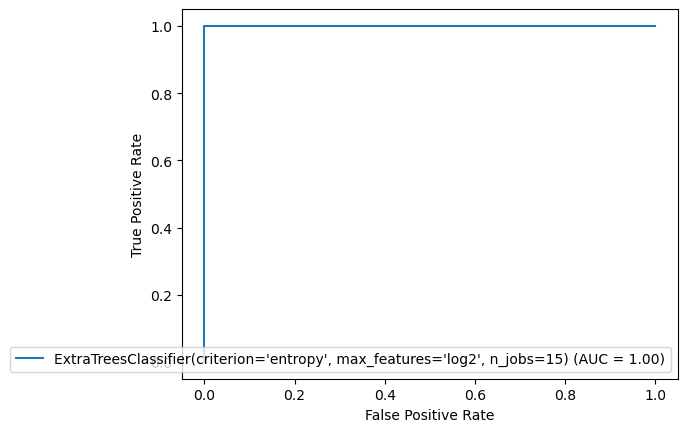

In [65]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, tuned_etr_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc = roc_auc, estimator_name = tuned_etr)
display.plot()

In [60]:
auc_score = roc_auc_score(y_test,tuned_etr_pred)
print(auc_score)

1.0


Finally the AOC 100#. which looks perfect. Remeber our Accuracy is 100 and cv is 91. This is perfect. 

# Saving the tunned model 

In [61]:
import pickle

In [67]:
filename = 'HR_Analytics_Proj_Tuned_Model.pkl'
pickle.dump(tuned_etr,open(filename,'wb'))

# Prediction

In [68]:
actual=np.array(y_test)
m_predicted=np.array(tuned_etr.predict(x_test))
df_comparison = pd.DataFrame({"original":actual,"predicted":m_predicted},index= range(len(actual)))
df_comparison

,original,predicted
0,0,0
1,1,1
2,1,1
3,1,1
4,0,0
...,...,...
574,1,1
575,1,1
576,0,0
577,0,0


The model predicted the first 5 rows correctly and also the last 5 rows correctly. 